In [20]:
#IMPORTANDO AS BIBLITECAS PYTHON UTILIZADAS

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from pandas import DataFrame , concat
from sklearn.metrics import mean_absolute_error , mean_squared_error
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from numpy import mean , concatenate
from math import sqrt
from pandas import read_csv
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,LSTM,Activation
from numpy import array , hstack
from tensorflow import keras
import tensorflow as tf
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import mean_absolute_error
import sklearn
import math

In [21]:
#url = 'Dataset.csv'
#dataset = pd.read_csv(url)


#path='/home/marcelo/Documentos/PosGraduacaoDataScience/Disciplinas/Monografia/DadosMonografia/dados_inmet_filtrados_2020.csv'
path='dados_inmet_filtrados_2020.csv'
dataset = pd.read_csv(path)
dataset = dataset.drop(['Hora UTC'], axis=1)
dataset

,Data,PRECIPITACAO TOTAL. HORARIO (mm),PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO. HORARIA (mB),PRESSAO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSAO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB),TEMPERATURA DO AR - BULBO SECO. HORARIA (Celsius),TEMPERATURA DO PONTO DE ORVALHO (Celsius),TEMPERATURA MAXIMA NA HORA ANT. (AUT) (Celsius),TEMPERATURA MAXIMA NA HORA ANT. (AUT) (Celsius).1,TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT) (Celsius),TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (Celsius),UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),UMIDADE RELATIVA DO AR. HORARIA (%),VENTO. DIRECAO HORARIA (gr) ((gr)),VENTO. RAJADA MAXIMA (m/s),VENTO. VELOCIDADE HORARIA (m/s);
0,2020/01/01,0.0,879.3,879.3,878.4,20.2,16.1,20.7,20.1,16.3,16.0,77.0,76.0,77.0,119.0,10.4,6.5
1,2020/01/01,0.0,880.0,880.0,879.2,19.8,15.8,20.2,19.7,16.1,15.8,79.0,77.0,78.0,92.0,9.7,4.5
2,2020/01/01,0.0,879.9,880.1,879.9,19.6,15.4,20.0,19.6,15.9,15.4,79.0,76.0,77.0,100.0,8.7,6.8
3,2020/01/01,0.0,879.7,880.0,879.6,19.2,15.1,19.6,19.1,15.4,15.1,78.0,77.0,77.0,107.0,9.4,6.3
4,2020/01/01,0.0,879.4,879.7,879.3,18.7,14.9,19.2,18.7,15.1,14.9,79.0,77.0,79.0,101.0,8.2,4.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2020/07/27,0.0,887.4,887.7,887.4,16.6,13.4,16.8,16.1,13.6,13.3,83.0,81.0,81.0,104.0,6.3,4.6
4996,2020/07/27,0.0,886.9,887.4,886.9,16.3,13.5,16.7,16.3,13.7,13.3,83.0,81.0,83.0,105.0,7.1,5.1
4997,2020/07/27,0.0,886.7,886.9,886.6,16.2,13.6,16.5,16.1,13.7,13.5,85.0,83.0,84.0,122.0,9.6,7.1
4998,2020/07/27,0.0,886.4,886.7,886.4,16.3,13.7,16.4,16.1,13.8,13.5,85.0,84.0,85.0,125.0,9.7,7.2


In [22]:
#x_1 = dataset['TEMPERATURA DO AR - BULBO SECO. HORARIA (Celsius)']
#x_2 = dataset['TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (Celsius)']
#y = dataset['TEMPERATURA MAXIMA NA HORA ANT. (AUT) (Celsius)']

x_1 = dataset['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)']
x_2 = dataset['TEMPERATURA MAXIMA NA HORA ANT. (AUT) (Celsius)']
y = dataset['TEMPERATURA DO AR - BULBO SECO. HORARIA (Celsius)']


x_1 = x_1.values
x_2 = x_2.values
y = y.values

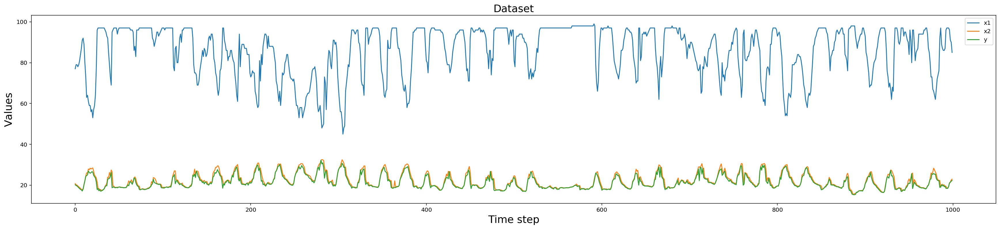

In [23]:
#default 10064
plt.figure(figsize=(30, 6))
plt.plot(x_1[:1000] , label='x1')
plt.plot(x_2[:1000] , label='x2')
plt.plot(y[:1000] , label='y')
plt.legend(loc='upper right')
plt.title("Dataset" ,  fontsize=18)
plt.xlabel('Time step' ,  fontsize=18)
plt.ylabel('Values' , fontsize=18)
plt.legend()
plt.show()

In [24]:
# convert to [rows, columns] structure
x_1 = x_1.reshape((len(x_1), 1))
x_2 = x_2.reshape((len(x_2), 1))
y = y.reshape((len(y), 1))

print ("x_1.shape" , x_1.shape) 
print ("x_2.shape" , x_2.shape) 
print ("y.shape" , y.shape) 

x_1.shape (5000, 1)
x_2.shape (5000, 1)
y.shape (5000, 1)


In [25]:
# normalization features
scaler = MinMaxScaler(feature_range=(0, 1))
x_1_scaled = scaler.fit_transform(x_1)
x_2_scaled = scaler.fit_transform(x_2)
y_scaled = scaler.fit_transform(y)

# horizontally stack columns
dataset_stacked = hstack((x_1_scaled, x_2_scaled, y_scaled))

print ("dataset_stacked.shape" , dataset_stacked.shape) 

dataset_stacked.shape (5000, 3)


In [26]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps_in
		out_end_ix = end_ix + n_steps_out-1
		# check if we are beyond the dataset
		if out_end_ix > len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)


In [27]:
# choose a number of time steps #change this accordingly
n_steps_in, n_steps_out = 96 , 6 

# covert into input/output
X, y = split_sequences(dataset_stacked, n_steps_in, n_steps_out)

print ("X.shape" , X.shape) 
print ("y.shape" , y.shape) 

X.shape (4900, 96, 2)
y.shape (4900, 6)


In [28]:
split = 4000
train_X , train_y = X[:split, :] , y[:split, :]
test_X , test_y = X[split:, :] , y[split:, :]

n_features = train_X.shape[2]


In [29]:
print ("train_X.shape" , train_X.shape) 
print ("train_y.shape" , train_y.shape) 
print ("test_X.shape" , test_X.shape) 
print ("test_y.shape" , test_y.shape) 
print ("n_features" , n_features)

train_X.shape (4000, 96, 2)
train_y.shape (4000, 6)
test_X.shape (900, 96, 2)
test_y.shape (900, 6)
n_features 2


**LSTM Model Parameter Setting**

In [30]:
# Definição da taxa de aprendizado
opt = keras.optimizers.Adam(learning_rate=0.01)

# define model
model = Sequential()
model.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps_in, n_features)))
model.add(LSTM(50, activation='relu'))
model.add(Dense(n_steps_out))
model.add(Activation('linear'))
model.compile(loss='mse' , optimizer=opt , metrics=['mse', 'mae'])


In [31]:
# Fit network
#history = model.fit(train_X , train_y , epochs=60 , steps_per_epoch=25 , verbose=1 ,validation_data=(test_X, test_y) ,shuffle=False)
history = model.fit(train_X , train_y , epochs=60 , steps_per_epoch=25 , verbose=2 ,validation_data=(test_X, test_y) ,shuffle=False)


Epoch 1/60
25/25 - 3s - loss: 72363736.0000 - mse: 72363736.0000 - mae: 977.4889 - val_loss: 0.1185 - val_mse: 0.1185 - val_mae: 0.3118
Epoch 2/60
25/25 - 2s - loss: 0.1985 - mse: 0.1985 - mae: 0.4148 - val_loss: 0.1290 - val_mse: 0.1290 - val_mae: 0.3272
Epoch 3/60
25/25 - 2s - loss: 0.1876 - mse: 0.1876 - mae: 0.3992 - val_loss: 0.1114 - val_mse: 0.1114 - val_mae: 0.2993
Epoch 4/60
25/25 - 2s - loss: 0.1651 - mse: 0.1651 - mae: 0.3701 - val_loss: 0.0932 - val_mse: 0.0932 - val_mae: 0.2682
Epoch 5/60
25/25 - 2s - loss: 0.1388 - mse: 0.1388 - mae: 0.3327 - val_loss: 0.0685 - val_mse: 0.0685 - val_mae: 0.2207
Epoch 6/60
25/25 - 2s - loss: 0.0953 - mse: 0.0953 - mae: 0.2611 - val_loss: 0.0313 - val_mse: 0.0313 - val_mae: 0.1403
Epoch 7/60
25/25 - 2s - loss: 0.0589 - mse: 0.0589 - mae: 0.1966 - val_loss: 0.0218 - val_mse: 0.0218 - val_mae: 0.1214
Epoch 8/60
25/25 - 2s - loss: 0.0408 - mse: 0.0408 - mae: 0.1596 - val_loss: 0.0208 - val_mse: 0.0208 - val_mae: 0.1190
Epoch 9/60
25/25 - 2s - 

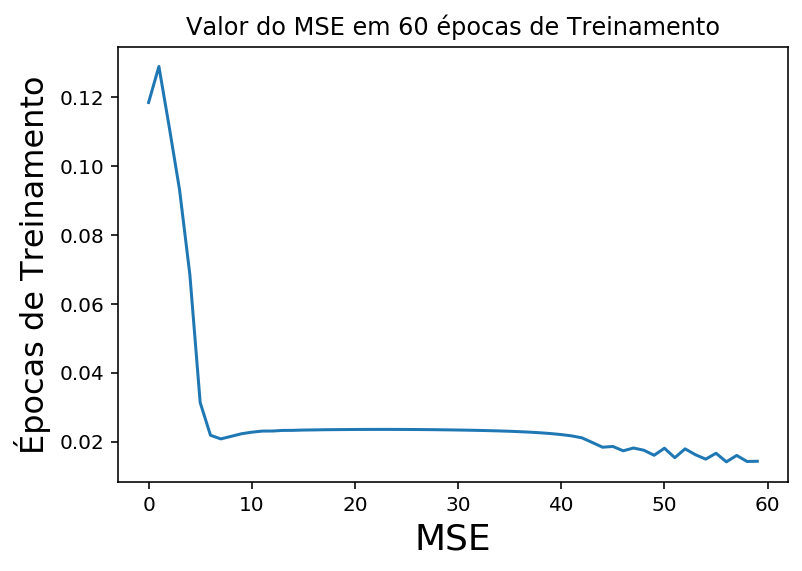

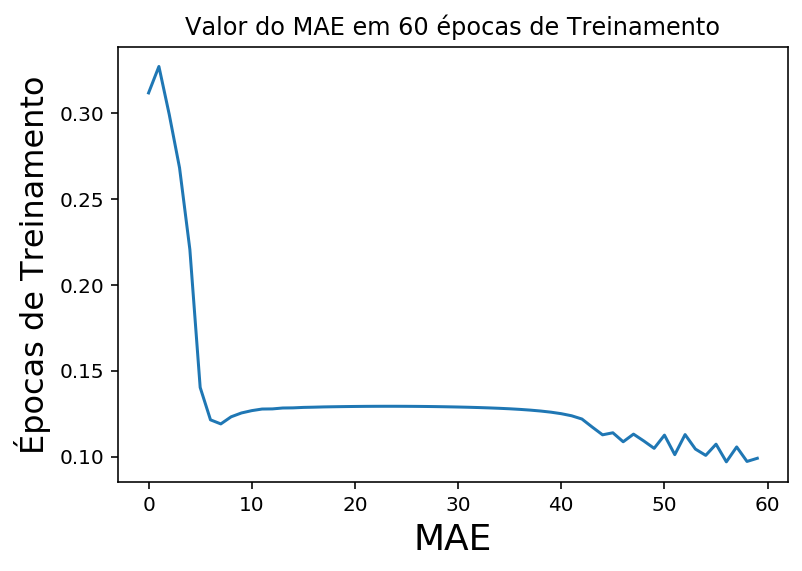

In [32]:
from numpy import array
from keras.models import Sequential
from keras.layers import Dense
from matplotlib import pyplot
# prepare sequence
#X = array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
# create model

# train model
#history = model.fit(X, X, epochs=500, batch_size=len(X), verbose=2)
# plot metrics
pyplot.plot(history.history['val_mse'])
pyplot.xlabel('MSE', fontsize=18)
pyplot.ylabel('Épocas de Treinamento', fontsize=16)
pyplot.title('Valor do MSE em 60 épocas de Treinamento', fontsize=12)
pyplot.show()

pyplot.plot(history.history['val_mae'])
pyplot.xlabel('MAE', fontsize=18)
pyplot.ylabel('Épocas de Treinamento', fontsize=16)
pyplot.title('Valor do MAE em 60 épocas de Treinamento', fontsize=12)
pyplot.show()

Evaluation



In [33]:
# Test Data Batch 1 , Test Data Batch 2 , Test Data Batch 3
#url_test = 'Test Data Batch 1.csv'
url_test = 'ValidateData.csv'
dataset_test_ok = pd.read_csv(url_test)
dataset_test_ok.head()

,Data,Hora UTC,PRECIPITACAO TOTAL. HORARIO (mm),PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO. HORARIA (mB),PRESSAO ATMOSFERICA MAX.NA HORA ANT. (AUT) (mB),PRESSAO ATMOSFERICA MIN. NA HORA ANT. (AUT) (mB),TEMPERATURA DO AR - BULBO SECO. HORARIA (Celsius),TEMPERATURA DO PONTO DE ORVALHO (Celsius),TEMPERATURA MAXIMA NA HORA ANT. (AUT) (Celsius),TEMPERATURA MAXIMA NA HORA ANT. (AUT) (Celsius).1,TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT) (Celsius),TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT) (Celsius),UMIDADE REL. MAX. NA HORA ANT. (AUT) (%),UMIDADE REL. MIN. NA HORA ANT. (AUT) (%),UMIDADE RELATIVA DO AR. HORARIA (%),VENTO. DIRECAO HORARIA (gr) ((gr)),VENTO. RAJADA MAXIMA (m/s),VENTO. VELOCIDADE HORARIA (m/s);
0,2020/11/29,0700 UTC,0.0,884.0,884.1,883.7,16.8,15.3,17.3,16.7,15.7,15.1,91.0,89.0,91.0,97.0,10.0,6.7
1,2020/11/29,0800 UTC,0.0,884.3,884.3,883.8,16.6,15.1,16.8,16.5,15.3,15.0,91.0,90.0,91.0,102.0,9.9,7.0
2,2020/11/29,0900 UTC,0.0,884.5,884.5,884.1,16.5,15.0,16.7,16.3,15.2,14.9,92.0,90.0,91.0,99.0,10.6,7.1
3,2020/11/29,1000 UTC,0.0,885.3,885.3,884.5,18.5,15.2,18.7,16.5,15.4,14.6,91.0,79.0,81.0,106.0,12.7,7.8
4,2020/11/29,1100 UTC,0.0,885.7,885.7,885.3,20.5,15.1,20.5,18.3,15.4,14.2,81.0,71.0,71.0,88.0,12.2,5.1


In [34]:
# read test data
x1_test = dataset_test_ok['UMIDADE REL. MAX. NA HORA ANT. (AUT) (%)'].values
x2_test = dataset_test_ok['TEMPERATURA MAXIMA NA HORA ANT. (AUT) (Celsius)'].values
y_test = dataset_test_ok['TEMPERATURA DO AR - BULBO SECO. HORARIA (Celsius)'].values # no need to scale


# convert to [rows, columns] structure
x1_test = x1_test.reshape((len(x1_test), 1))
x2_test = x2_test.reshape((len(x2_test), 1))
y_test = y_test.reshape((len(y_test), 1))

x1_test_scaled = scaler.fit_transform(x1_test)
x2_test_scaled = scaler.fit_transform(x2_test)


In [35]:
def calculateStatisticalMetrics(dataList1, dataList2):
    from sklearn.metrics import mean_squared_error
    from math import sqrt
    from sklearn.metrics import mean_absolute_error

    mse = sklearn.metrics.mean_squared_error(dataList1, dataList2)
    rmse = math.sqrt(mse)
    mae = mean_absolute_error(dataList1, dataList2)
    print('RMSE = %f: MSE = %f MAE = %f' % (rmse, mse, mae))




def prep_data(x1_test_scaled , x2_test_scaled , y_test , start , end , last):
    #prepare test data X
    dataset_test = hstack((x1_test_scaled, x2_test_scaled))
    dataset_test_X = dataset_test[start:end, :]
    test_X_new = dataset_test_X.reshape(1, dataset_test_X.shape[0] , dataset_test_X.shape[1])

    #prepare past and groundtruth
    past_data = y_test[:end , :]
    dataset_test_y = y_test[end:last , :]
    scaler1 = MinMaxScaler(feature_range=(0, 1))
    scaler1.fit(dataset_test_y)

    # predictions
    y_pred = model.predict(test_X_new)
    y_pred_inv = scaler1.inverse_transform(y_pred)
    y_pred_inv = y_pred_inv.reshape(n_steps_out,1)
    y_pred_inv = y_pred_inv[:,0]
    
    return y_pred_inv , dataset_test_y , past_data

# Calculate MAE and RMSE
def evaluate_prediction(predictions, actual, model_name , start , end):
    errors = predictions - actual
    mse = np.square(errors).mean()
    rmse = np.sqrt(mse)
    mae = np.abs(errors).mean()

    print("Test Data from {} to {}".format(start, end))
    print('Mean Absolute Error: {:.6f}'.format(mae))
    print('Root Mean Square Error: {:.6f}'.format(rmse))
    print('')
    print('')

# Plot history and future
def plot_multistep(history, prediction1 , groundtruth , start , end):
    
    plt.figure(figsize=(20, 4))

    y_mean = mean(prediction1)

    range_history = len(history)
    range_future = list(range(range_history, range_history + len(prediction1)))

    plt.plot(np.arange(range_history), np.array(history), label='History')
    plt.plot(range_future, np.array(prediction1),label='Forecasted with LSTM')
    plt.plot(range_future, np.array(groundtruth),label='GroundTruth')

    plt.legend(loc='upper right')
    plt.title("Test Data from {} to {} , Mean = {:.2f}".format(start, end, y_mean) ,  fontsize=18)
    plt.xlabel('Time step' ,  fontsize=18)
    plt.ylabel('y-value' , fontsize=18)

In [36]:
# Plot histórico e futuro
def plot_multistep(history, prediction1 , groundtruth , start , end):
    plt.figure(figsize=(20, 4))
    y_mean = mean(prediction1)
    range_history = len(history)
    range_future = list(range(range_history, range_history + len(prediction1)))
    plt.plot(np.arange(range_history), np.array(history), label='History')
    plt.plot(range_future, np.array(prediction1),label='Forecasted with LSTM')
    plt.plot(range_future, np.array(groundtruth),label='GroundTruth')
    plt.legend(loc='upper right')
    plt.title("Test Data from {} to {} , Mean = {:.2f}".format(start, end, y_mean) ,  fontsize=18)
    plt.xlabel('Time step' ,  fontsize=18)
    plt.ylabel('y-value' , fontsize=18)

Test Data from 114 to 210
Mean Absolute Error: 0.345662
Root Mean Square Error: 0.383753


Test Data from 120 to 216
Mean Absolute Error: 0.534461
Root Mean Square Error: 0.568850


Test Data from 126 to 222
Mean Absolute Error: 0.867678
Root Mean Square Error: 0.967247


Test Data from 132 to 228
Mean Absolute Error: 1.882708
Root Mean Square Error: 2.081140


Test Data from 138 to 234
Mean Absolute Error: 1.194280
Root Mean Square Error: 1.258987


Test Data from 144 to 240
Mean Absolute Error: 0.592087
Root Mean Square Error: 0.695524


Test Data from 150 to 246
Mean Absolute Error: 0.766667
Root Mean Square Error: 0.947479


Test Data from 156 to 252
Mean Absolute Error: 1.133333
Root Mean Square Error: 1.191078


Test Data from 162 to 258
Mean Absolute Error: 0.716667
Root Mean Square Error: 0.828870


Test Data from 168 to 264
Mean Absolute Error: 0.353089
Root Mean Square Error: 0.398616


Test Data from 174 to 270
Mean Absolute Error: 0.718701
Root Mean Square Error: 0.890367



/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


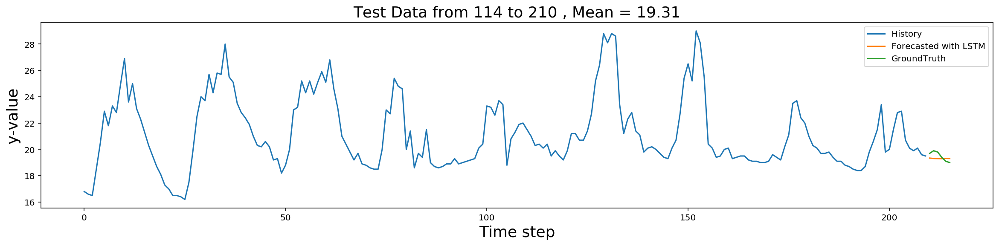

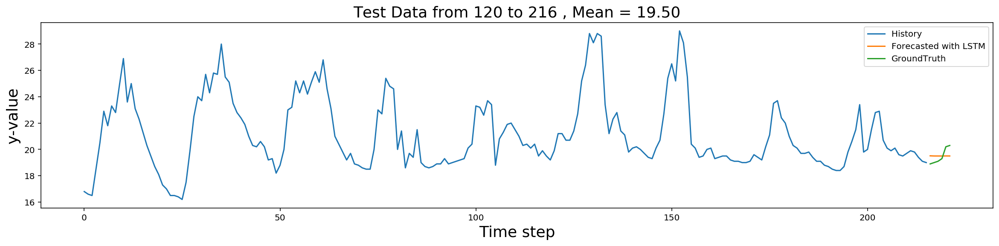

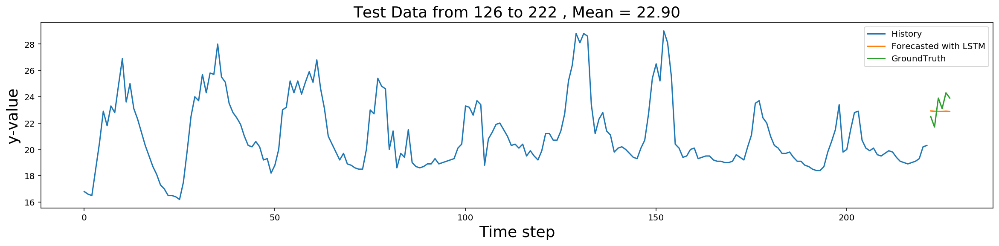

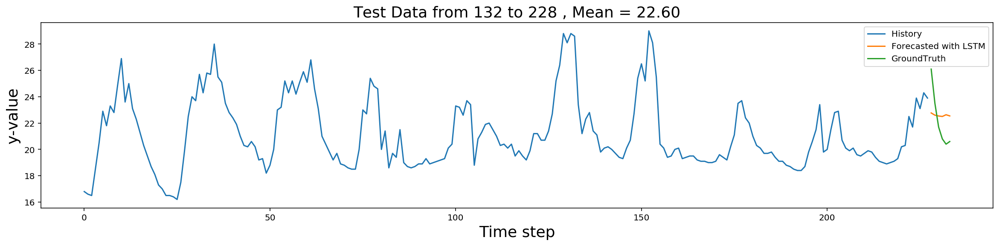

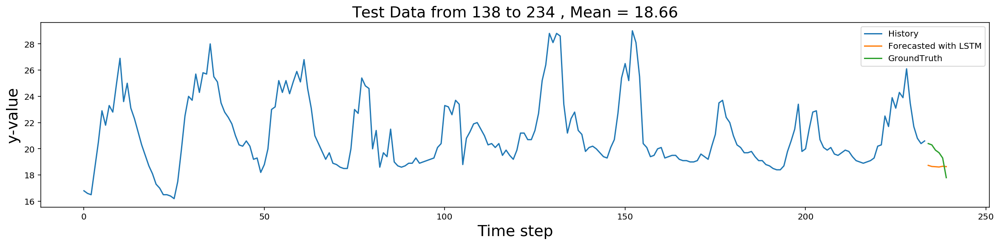

...

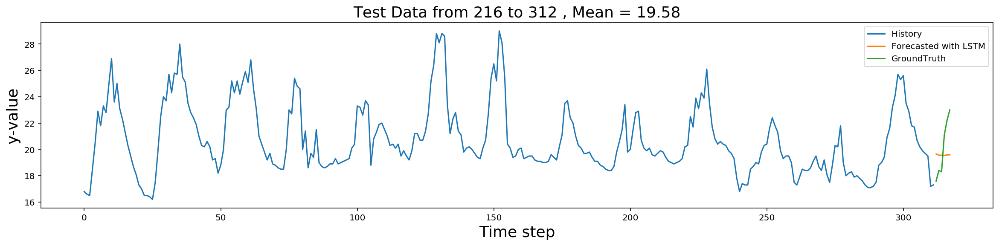

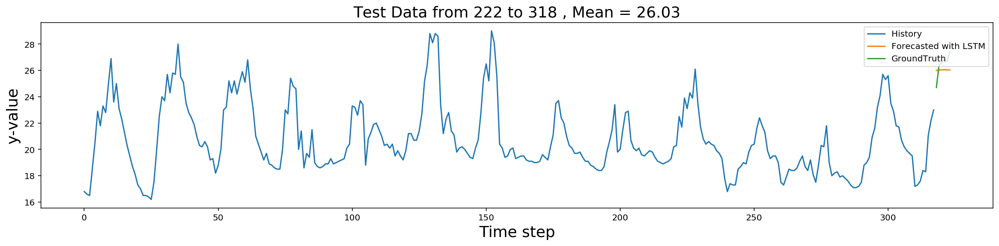

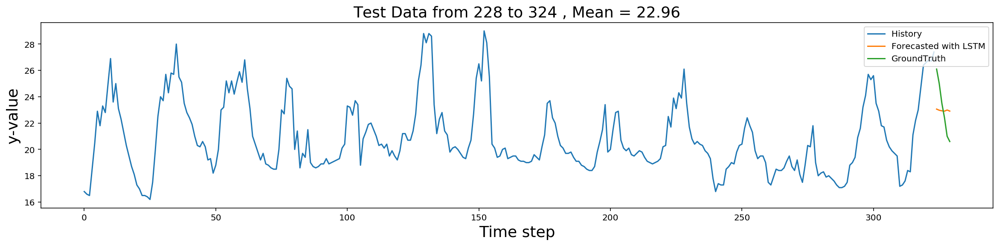

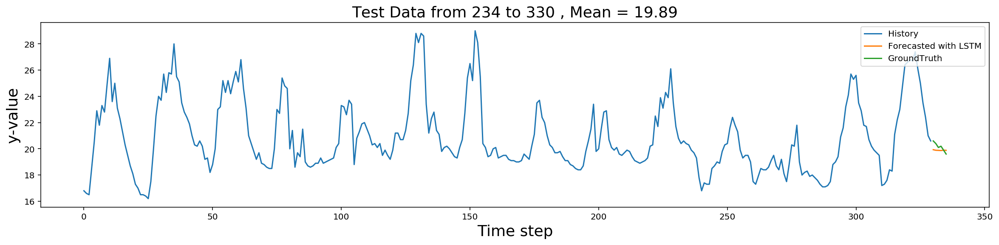

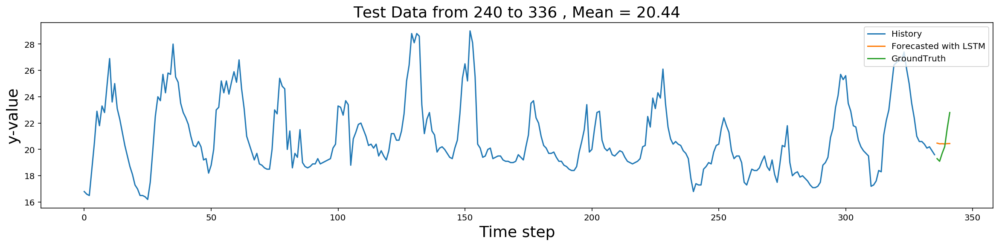

In [37]:
#for i in range(120,172,24):
for i in range(114,244,6):
    start = i
    end = start + n_steps_in 
    last = end + n_steps_out 
    y_pred_inv , dataset_test_y , past_data = prep_data(x1_test_scaled , x2_test_scaled , y_test , start , end , last) 
    evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , start , end) 
    plot_multistep(past_data , y_pred_inv , dataset_test_y , start , end) 


Save & Load


In [43]:
#Aplicando o modelo de machine learning para prever as próximas 6 horas
#Carregando dados de julho 

path='dados_inmet_filtrados_2021.csv'
dataset_test_ok = pd.read_csv(path)
#dataset = dataset.drop(['Hora UTC'], axis=1)
dataset_test_ok.tail()


,Data Medicao,Hora Medicao,PRECIPITACAO TOTAL. HORARIO(mm),PRESSAO ATMOSFERICA AO NIVEL DA ESTACAO. HORARIA(mB),PRESSAO ATMOSFERICA REDUZIDA NIVEL DO MAR. AUT(mB),PRESSAO ATMOSFERICA MAX.NA HORA ANT. (AUT)(mB),PRESSAO ATMOSFERICA MIN. NA HORA ANT. (AUT)(mB),TEMPERATURA DA CPU DA ESTACAO(Celsius),TEMPERATURA DO AR - BULBO SECO. HORARIA(Celsius),TEMPERATURA DO PONTO DE ORVALHO(°C),...,TEMPERATURA MINIMA NA HORA ANT. (AUT)(Celsius),TEMPERATURA ORVALHO MAX. NA HORA ANT. (AUT)(Celsius),TEMPERATURA ORVALHO MIN. NA HORA ANT. (AUT)(Celsius),TENSAO DA BATERIA DA ESTACAO(V),UMIDADE REL. MAX. NA HORA ANT. (AUT)(%),UMIDADE REL. MIN. NA HORA ANT. (AUT)(%),UMIDADE RELATIVA DO AR. HORARIA(%),VENTO DIRECAO HORARIA (gr)(° (gr)),VENTO. RAJADA MAXIMA(m/s),VENTO. VELOCIDADE HORARIA(m/s);
321,2021-07-14,900,0,886.4,1024.751180,886.5,886.3,14,13.3,10.2,...,13.3,10.7,10.2,12.4,83,81,82,96,7.9,4.6
322,2021-07-14,1000,0,886.9,1025.225469,886.9,886.4,14,13.5,10.8,...,12.8,10.8,9.9,13.2,84,82,83,112,6.8,4.9
323,2021-07-14,1100,0,887.4,1024.417060,887.4,886.9,15,16.2,10.5,...,13.5,11.1,10.2,14.3,83,69,69,104,7.8,5.3
324,2021-07-14,1200,0,888.1,1024.064916,888.1,887.4,18,18.5,10.1,...,16.0,11.6,9.9,14.3,69,58,58,107,7.2,3.0
325,2021-07-14,1300,0,888.2,1023.187039,888.3,888.1,21,20.5,9.5,...,17.9,11.2,9.2,14.3,60,49,49,59,6.4,3.3


In [44]:
# read test data
x1_test = dataset_test_ok['UMIDADE REL. MAX. NA HORA ANT. (AUT)(%)'].values
x2_test = dataset_test_ok['TEMPERATURA MAXIMA NA HORA ANT. (AUT)(Celsius)'].values
y_test = dataset_test_ok['TEMPERATURA DO AR - BULBO SECO. HORARIA(Celsius)'].values # no need to scale


# convert to [rows, columns] structure
x1_test = x1_test.reshape((len(x1_test), 1))
x2_test = x2_test.reshape((len(x2_test), 1))
y_test = y_test.reshape((len(y_test), 1))

x1_test_scaled = scaler.fit_transform(x1_test)
x2_test_scaled = scaler.fit_transform(x2_test)


In [45]:
def prep_data(x1_test_scaled , x2_test_scaled , y_test , start , end , last):
    #prepare test data X
    dataset_test = hstack((x1_test_scaled, x2_test_scaled))
    dataset_test_X = dataset_test[start:end, :]
    test_X_new = dataset_test_X.reshape(1, dataset_test_X.shape[0] , dataset_test_X.shape[1])

    #prepare past and groundtruth
    past_data = y_test[:end , :]
    dataset_test_y = y_test[end:last , :]
    scaler1 = MinMaxScaler(feature_range=(0, 1))
    scaler1.fit(dataset_test_y)

    # predictions
    y_pred = model.predict(test_X_new)
    y_pred_inv = scaler1.inverse_transform(y_pred)
    y_pred_inv = y_pred_inv.reshape(n_steps_out,1)
    y_pred_inv = y_pred_inv[:,0]
    
    return y_pred_inv , dataset_test_y , past_data

# Calculate MAE and RMSE
def evaluate_prediction(predictions, actual, model_name , start , end):
    errors = predictions - actual
    mse = np.square(errors).mean()
    rmse = np.sqrt(mse)
    mae = np.abs(errors).mean()

    print("Test Data from {} to {}".format(start, end))
    print('Mean Absolute Error: {:.6f}'.format(mae))
    print('Root Mean Square Error: {:.6f}'.format(rmse))
    print('')
    print('')

# Plot history and future
def plot_multistep(history, prediction1 , groundtruth , start , end):
    
    plt.figure(figsize=(20, 4))

    y_mean = mean(prediction1)

    range_history = len(history)
    range_future = list(range(range_history, range_history + len(prediction1)))

    plt.plot(np.arange(range_history), np.array(history), label='History')
    plt.plot(range_future, np.array(prediction1),label='Forecasted with LSTM')
    plt.plot(range_future, np.array(groundtruth),label='GroundTruth')

    plt.legend(loc='upper right')
    plt.title("Test Data from {} to {} , Mean = {:.2f}".format(start, end, y_mean) ,  fontsize=18)
    plt.xlabel('Time step' ,  fontsize=18)
    plt.ylabel('y-value' , fontsize=18)

In [46]:
# Plot history and future
def plot_multistep(history, prediction1 , groundtruth , start , end):
    plt.figure(figsize=(20, 4))
    y_mean = mean(prediction1)
    range_history = len(history)
    range_future = list(range(range_history, range_history + len(prediction1)))
    plt.plot(np.arange(range_history), np.array(history), label='History')
    plt.plot(range_future, np.array(prediction1),label='Forecasted with LSTM')
    plt.plot(range_future, np.array(groundtruth),label='GroundTruth')
    plt.legend(loc='upper right')
    plt.title("Test Data from {} to {} , Mean = {:.2f}".format(start, end, y_mean) ,  fontsize=18)
    plt.xlabel('Time step' ,  fontsize=18)
    plt.ylabel('y-value' , fontsize=18)

Test Data from 0 to 96
Mean Absolute Error: 0.516667
Root Mean Square Error: 0.621471


Test Data from 6 to 102
Mean Absolute Error: 0.829443
Root Mean Square Error: 0.962816


Test Data from 12 to 108
Mean Absolute Error: 1.456852
Root Mean Square Error: 1.687712


Test Data from 18 to 114
Mean Absolute Error: 1.849898
Root Mean Square Error: 2.037177


Test Data from 24 to 120
Mean Absolute Error: 0.684083
Root Mean Square Error: 0.872038


Test Data from 30 to 126
Mean Absolute Error: 0.318244
Root Mean Square Error: 0.401255


Test Data from 36 to 132
Mean Absolute Error: 1.441233
Root Mean Square Error: 1.832053


Test Data from 42 to 138
Mean Absolute Error: 1.583333
Root Mean Square Error: 1.768189


Test Data from 48 to 144
Mean Absolute Error: 0.787416
Root Mean Square Error: 0.877722


Test Data from 54 to 150
Mean Absolute Error: 0.204669
Root Mean Square Error: 0.313793


Test Data from 60 to 156
Mean Absolute Error: 1.569233
Root Mean Square Error: 1.769556


Test Data fro

/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures crea

Test Data from 138 to 234
Mean Absolute Error: 1.732747
Root Mean Square Error: 1.963686


Test Data from 144 to 240
Mean Absolute Error: 0.789097
Root Mean Square Error: 0.920851


Test Data from 150 to 246
Mean Absolute Error: 0.971662
Root Mean Square Error: 1.168189


Test Data from 156 to 252
Mean Absolute Error: 1.050000
Root Mean Square Error: 1.176810




/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures crea

Test Data from 162 to 258
Mean Absolute Error: 1.643892
Root Mean Square Error: 1.857171


Test Data from 168 to 264
Mean Absolute Error: 0.629395
Root Mean Square Error: 0.780865


Test Data from 174 to 270
Mean Absolute Error: 0.839943
Root Mean Square Error: 1.131455


Test Data from 180 to 276
Mean Absolute Error: 1.445022
Root Mean Square Error: 1.577607


Test Data from 186 to 282
Mean Absolute Error: 2.035111
Root Mean Square Error: 2.173893




/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures crea

Test Data from 192 to 288
Mean Absolute Error: 0.520492
Root Mean Square Error: 0.604520


Test Data from 198 to 294
Mean Absolute Error: 0.602067
Root Mean Square Error: 0.830549


Test Data from 204 to 300
Mean Absolute Error: 1.482147
Root Mean Square Error: 1.633835


Test Data from 210 to 306
Mean Absolute Error: 1.656641
Root Mean Square Error: 1.832066


Test Data from 216 to 312
Mean Absolute Error: 0.300000
Root Mean Square Error: 0.360700




/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until
/home/marcelo/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures crea

Test Data from 222 to 318
Mean Absolute Error: 0.934510
Root Mean Square Error: 1.049224




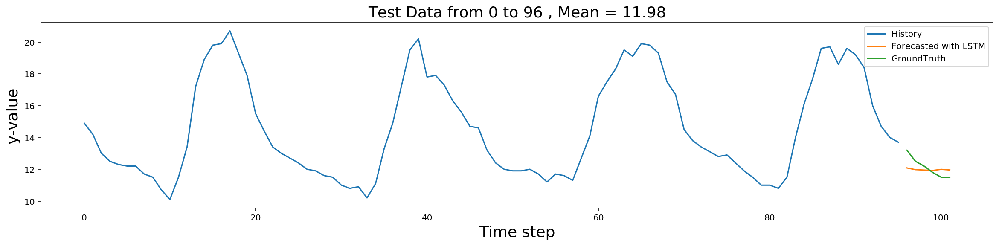

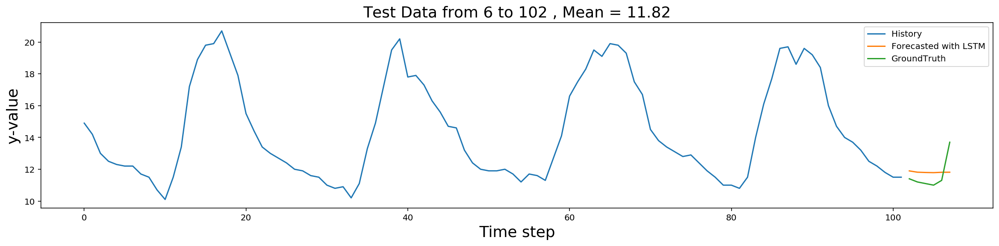

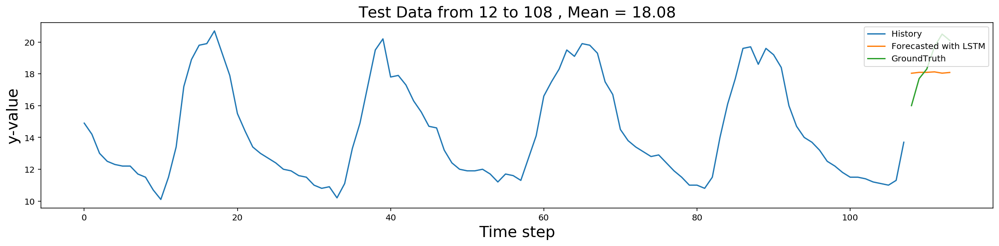

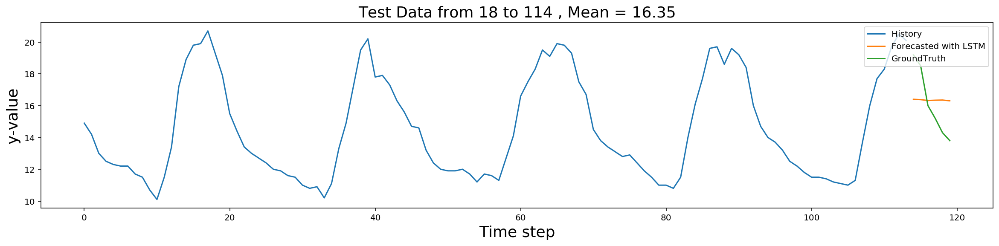

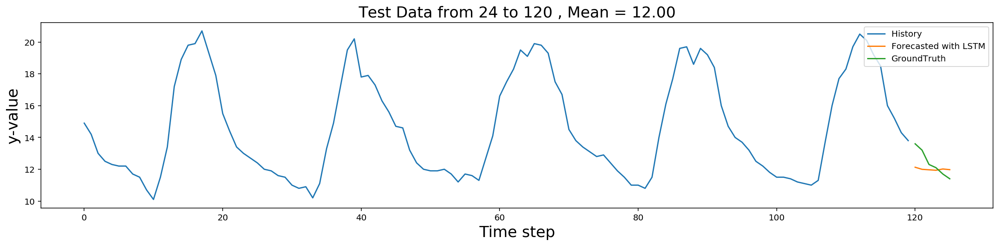

...

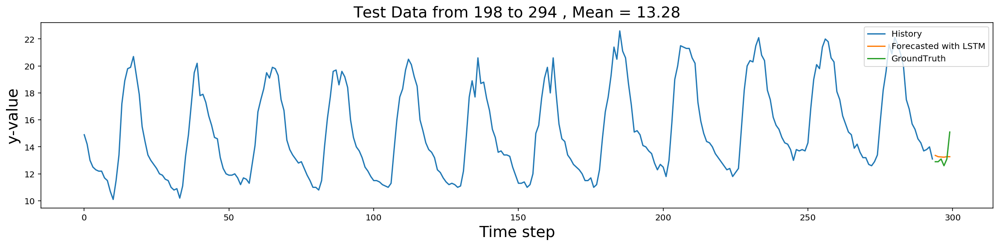

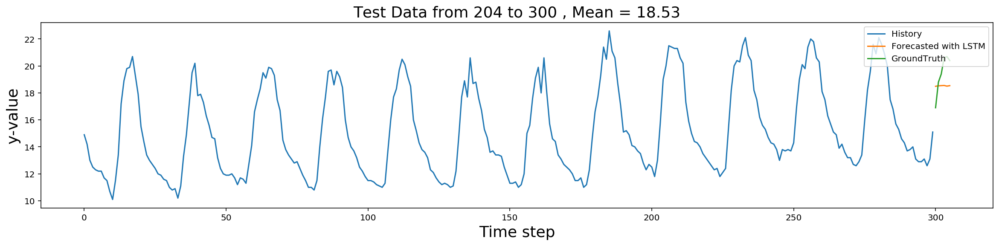

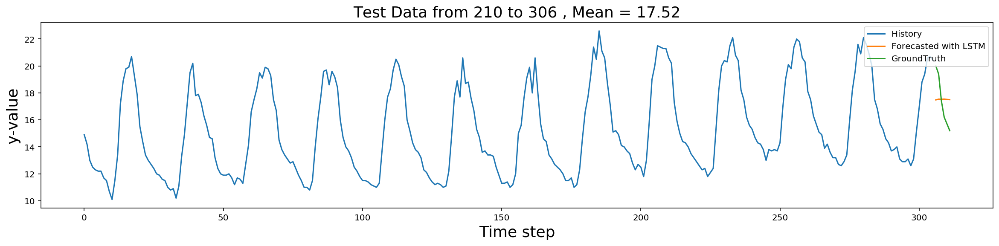

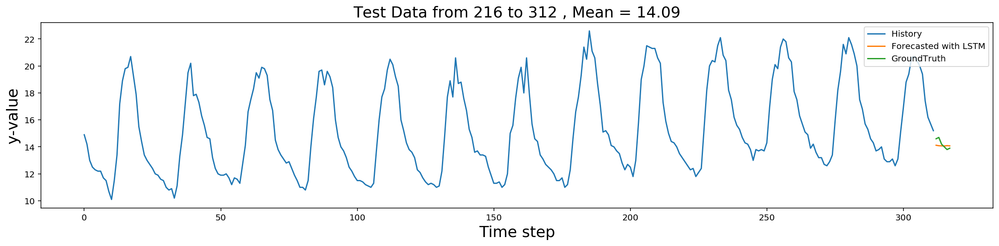

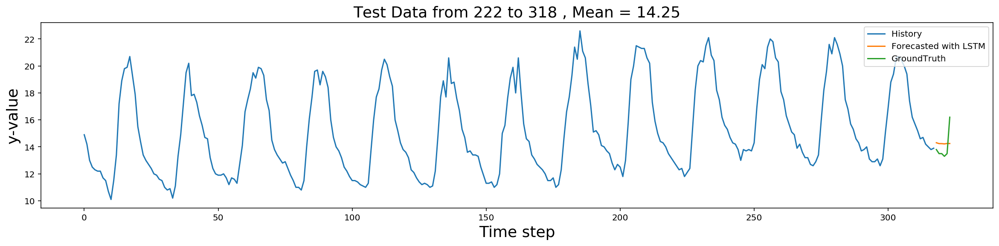

In [47]:
#for i in range(120,172,24): velho
#for i in range(114,238,6):

#for i in range(114,144,12): #funcionando
for i in range(0,228,6): #funcionando
    start = i
    end = start + n_steps_in 
    last = end + n_steps_out 
    y_pred_inv , dataset_test_y , past_data = prep_data(x1_test_scaled , x2_test_scaled , y_test , start , end , last) 
    evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , start , end) 
    plot_multistep(past_data , y_pred_inv , dataset_test_y , start , end) 


Test Data from 0 to 327
Mean Absolute Error: 0.934510
Root Mean Square Error: 1.049224




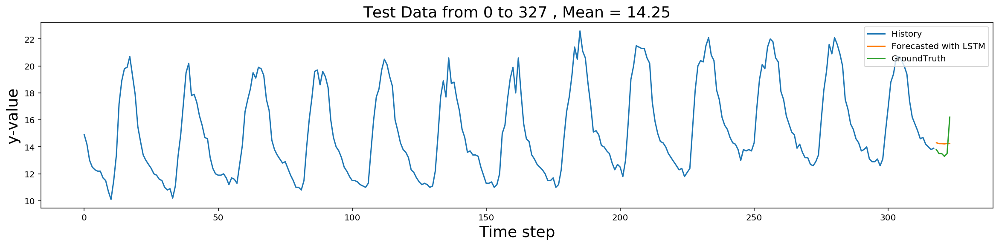

In [48]:
evaluate_prediction(y_pred_inv , dataset_test_y, 'LSTM' , 0 , 327) 
plot_multistep(past_data , y_pred_inv , dataset_test_y , 0 , 327) 


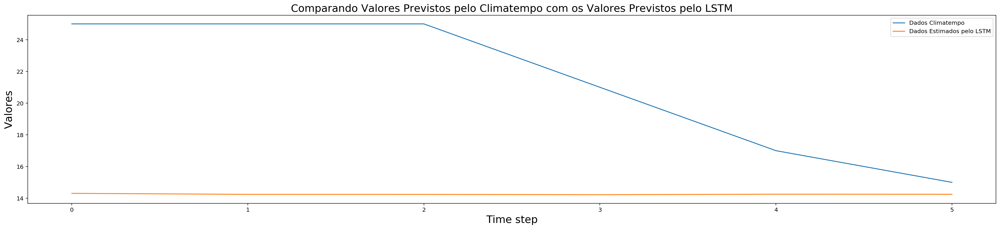

RMSE = 8.164179: MSE = 66.653820 MAE = 7.081569


In [49]:
path = '/home/marcelo/Documentos/PosGraduacaoDataScience/Disciplinas/Monografia/DadosMonografia/PrevisoesClimatempo.csv'
dataClimatempo = (read_csv(path))
plt.figure(figsize=(30, 6))
plt.plot(dataClimatempo[:7] , label='Dados Climatempo')
plt.plot(y_pred_inv[:7] , label='Dados Estimados pelo LSTM')
#plt.plot(y[:1000] , label='y')
plt.legend(loc='upper right')
plt.title("Comparando Valores Previstos pelo Climatempo com os Valores Previstos pelo LSTM" ,  fontsize=18)
plt.xlabel('Time step' ,  fontsize=18)
plt.ylabel('Valores' , fontsize=18)
plt.legend()
plt.show()
calculateStatisticalMetrics(dataClimatempo, y_pred_inv)